Simulating the collapse of a self-gravitating adiabatic gas sphere, following section 6.2 of the Gadget-2 Paper.

# Adabiatic Gas Cloud Collapse

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import astropy.units as u
import astropy.constants as c
import gravhydro as gh

In [2]:

plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.top'] = True
plt.rcParams['ytick.right'] = True
plt.rcParams['font.size'] = 12.5
plt.rcParams['axes.labelsize'] = 14
plt.rcParams["text.usetex"] = False
plt.rcParams["mathtext.fontset"] = "stix"

## Particles initialized with density ~ 1/r

Use inverse transform sampling.

Probability of find a particle in an infinitesimal volume element $dV = 4 \pi r^2 dr$ is $P(r) dV$.

$ r = R_{\text{max}} \sqrt{U}$, where $U$ are uniformly distributed random numbers.




In [3]:
n_pts = int(2e3)
U = np.random.uniform(0, 1, n_pts)

Rmax = 10 * u.pc #(5e16 * u.cm).to(u.pc) # units pc
Rs = Rmax * np.sqrt(U)
phis = 2 * np.pi * np.random.uniform(0, 1, n_pts)
thetas = np.arccos(2 * np.random.rand(n_pts) - 1)

xs = Rs * np.sin(thetas) * np.cos(phis)
ys = Rs * np.sin(thetas) * np.sin(phis)
zs = Rs * np.cos(thetas)
pos = np.array([xs, ys, zs]).T * u.pc

## Particles initialized with uniform density : M ~ r^3



In [4]:
# Generate uniform density sphere using inverse transform sampling
# For uniform density: M ~ r^3, so r = R_max * U^(1/3)

n_pts_uniform = int(8e3)
U_uniform = np.random.uniform(0, 1, n_pts_uniform)

Rmax_uniform = 50 * u.pc #(0.5 * u.kpc).to(u.pc)
Rs_uniform = Rmax_uniform * np.cbrt(U_uniform)  # cube root for uniform density
phis_uniform = 2 * np.pi * np.random.uniform(0, 1, n_pts_uniform)
thetas_uniform = np.arccos(2 * np.random.rand(n_pts_uniform) - 1)

xs_uniform = Rs_uniform * np.sin(thetas_uniform) * np.cos(phis_uniform)
ys_uniform = Rs_uniform * np.sin(thetas_uniform) * np.sin(phis_uniform)
zs_uniform = Rs_uniform * np.cos(thetas_uniform)
pos = np.array([xs_uniform, ys_uniform, zs_uniform]).T * u.pc

## density

In [5]:
from scipy.spatial import KDTree

# Build KDTree for efficient nearest neighbor search
tree = KDTree(pos.value)

# Query for the 2 nearest neighbors (includes the particle itself)
# k=2 because the closest neighbor is the particle itself
distances, indices = tree.query(pos.value, k=2)

# The second column contains distances to the nearest neighbor (excluding itself)
nearest_neighbor_distances = distances[:, 1] * u.pc

# Calculate average nearest neighbor distance
avg_nearest_neighbor_distance = np.mean(nearest_neighbor_distances)

print(f"Average nearest neighbor distance: {avg_nearest_neighbor_distance:.4f}")

Average nearest neighbor distance: 2.2729 pc


In [6]:
# Confirm that denities follow 1/r power law.
# cloud_mass = 1 * u.Msun
# cloud_volume = (4/3) * np.pi * Rmax**3
# particle_mass = cloud_mass / n_pts
# masses = np.ones(n_pts_uniform) #gh.convert_to_internal(np.ones(n_pts_uniform) * u.Msun, None, None, None)# * particle_mass

# from gravhydro import densities, convert_to_internal, convert_to_physical
# h = 2 * avg_nearest_neighbor_distance
# dens = densities(convert_to_internal(pos), convert_to_internal(masses), convert_to_internal(h))
# dens = convert_to_physical(dens, 'mass density', True)

# Pick params for specific free-fall time

In [7]:
volume = (4 / 3) * np.pi * Rmax_uniform**3

target_fft = 50 * u.Myr
target_density = (3 * np.pi / (32 * c.G * target_fft**2)).to(u.Msun / u.pc**3)
total_mass = target_density * volume
mass_per_particle = total_mass / n_pts_uniform
masses = np.ones(n_pts_uniform) * mass_per_particle

In [8]:
density = np.sum(masses) / volume # a bit redundant with target_density

## Pressure

In [9]:
internal_energy = 0.05
gamma = 5/3

# pressures = gh.pressure(dens, gamma=gamma, u=internal_energy)

In [10]:
def freefallTime(density):
    '''Returns the free fall time.'''
    return np.sqrt(3 * np.pi / (32 * c.G * density)).to(u.Myr)

In [11]:
fft = freefallTime(density)
print(fft.to(u.Myr)) # also redundant because we set this, but good to see it works!

50.0 Myr


In [12]:
total_mass

<Quantity 13712.34811717 solMass>

In [13]:
mass_per_particle

<Quantity 1.71404351 solMass>

## Simulation

In [14]:
sim = gh.Simulation()

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [15]:
vel = np.zeros_like(pos)

In [16]:
ts = np.linspace(0, 4*fft, 2400)

In [17]:
sim.run(pos, vel, masses, ts, gravityMethod='directSummation', use_numba=True, gravityOnly=True, unitLength=1 * u.pc, softening= 10 * u.pc)

  0%|          | 1/2399 [00:00<14:47,  2.70it/s]

100%|██████████| 2399/2399 [10:05<00:00,  3.96it/s] 


In [19]:
# i = -1
# plt.figure(figsize=(7,7))
# plt.scatter(sim.positions[0, :,0], sim.positions[0, :,1])
# plt.scatter(sim.positions[i, :,0], sim.positions[i, :,1])
# plt.xlim(-0.01, 0.01)
# plt.ylim(-0.01, 0.01)

In [20]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(7, 7))

def update(frame):
    ax.clear()
    #ax.scatter(sim.positions[0, :, 0], sim.positions[0, :, 1], alpha=0.5, label='Initial')
    # Sort particles by z-coordinate for depth perception
    z_order = np.argsort(sim.positions[frame*24, :, 2].value)
    ax.scatter(sim.positions[frame*24, z_order, 0].to(u.pc), sim.positions[frame*24, z_order, 1].to(u.pc), 
               alpha=0.75, s=2, c='k')
    ax.set_xlim(-50,50)
    ax.set_ylim(-50,50)
    ax.set_xlabel('x [pc]', fontsize=20)
    ax.set_ylabel('y [pc]', fontsize=20)
    ax.set_title(f'$t/t_{{\\text{{ff}}}} = {(ts[frame*24] / fft).decompose().value :.2f}$', fontsize=25)

anim = FuncAnimation(fig, update, frames=len(sim.positions)//24, interval=100, repeat=True)
plt.close()
# HTML(anim.to_jshtml())

In [21]:
anim.save('uniform_dens_collapse_gravOnly.mp4')

In [ ]:

# fig, ax = plt.subplots(figsize=(7, 7))

# def update(frame):
#     ax.clear()
#     #ax.scatter(sim.positions[0, :, 0], sim.positions[0, :, 1], alpha=0.5, label='Initial')
#     ax.scatter(sim.positions[frame*10, :, 0], sim.positions[frame*10, :, 2], alpha=0.75, label=f'Frame {frame*10}')
#     ax.set_xlim(-0.01, 0.01)
#     ax.set_ylim(-0.01, 0.01)
#     ax.set_xlabel('x')
#     ax.set_ylabel('y')
#     ax.set_title(f't = {(ts[frame] / fft).decompose().value}')

# anim = FuncAnimation(fig, update, frames=len(sim.positions)//10, interval=100, repeat=True)
# plt.close()
# HTML(anim.to_jshtml())

In [ ]:
# import plotly.graph_objects as go

# # Get final positions from the simulation
# final_positions = sim.positions[100]

# # Calculate final radial distances for color mapping
# final_Rs = np.sqrt(final_positions[:, 0]**2 + final_positions[:, 1]**2 + final_positions[:, 2]**2)

# fig = go.Figure(data=[go.Scatter3d(
#     x=final_positions[:, 0],
#     y=final_positions[:, 1],
#     z=final_positions[:, 2],
#     mode='markers',
#     marker=dict(
#         size=2,
#         color=final_Rs,
#         colorscale='Viridis',
#         showscale=True,
#         colorbar=dict(title='R (pc)')
#     )
# )])

# fig.update_layout(
#     title='Final Particle Positions (Gravity-Only Simulation)',
#     scene=dict(
#         xaxis_title='x (pc)',
#         yaxis_title='y (pc)',
#         zaxis_title='z (pc)'
#     ),
#     width=800,
#     height=800
# )

# fig.show()

In [22]:
hydrosim = gh.Simulation()
hydrosim.run(pos, vel, masses, ts, gravityMethod='directSummation', use_numba=True, gravityOnly=False, hydroOnly=False, unitLength=1 * u.pc, cs = 0.003, h=2*avg_nearest_neighbor_distance, softening=2*avg_nearest_neighbor_distance)

100%|██████████| 2399/2399 [10:04<00:00,  3.97it/s]


In [23]:
fig, ax = plt.subplots(figsize=(7, 7))

def update(frame):
    ax.clear()
    #ax.scatter(sim.positions[0, :, 0], sim.positions[0, :, 1], alpha=0.5, label='Initial')
    z_order = np.argsort(hydrosim.positions[frame*24, :, 2].value)
    ax.scatter(hydrosim.positions[frame*24, z_order, 0].to(u.pc), hydrosim.positions[frame*24, z_order, 1].to(u.pc), 
               alpha=0.75, s=5, c='k', cmap='viridis')
    ax.set_xlim(-50,50)
    ax.set_ylim(-50,50)
  # ax.scatter(hydrosim.positions[frame*10, :, 0], hydrosim.positions[frame*10, :, 1], alpha=0.75, label=f'Frame {frame*10}')  
    ax.set_xlabel('x [pc]', fontsize=20)
    ax.set_ylabel('y [pc]', fontsize=20)
    ax.set_title(f'$t/t_{{\\text{{ff}}}} = {(ts[frame*24] / fft).decompose().value :.2f}$', fontsize=25)

animhydro = FuncAnimation(fig, update, frames=len(hydrosim.positions)//24, interval=100, repeat=True)
plt.close()
#HTML(anim.to_jshtml())

In [24]:
animhydro.save('uniform_dens_collapse_hydro.mp4')

/var/folders/s1/bxkg8f1501g2q16qjhch2_qw0000gn/T/ipykernel_55194/500287300.py:7: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(hydrosim.positions[frame*24, z_order, 0].to(u.pc), hydrosim.positions[frame*24, z_order, 1].to(u.pc),


In [ ]:
# fig, ax = plt.subplots(figsize=(7, 7))

# def update(frame):
#     ax.clear()
#     # Sort particles by z-coordinate for depth perception
#     z_order = np.argsort(hydrosim.positions[frame*10, :, 2].value)
    
#     # Get z-coordinates and normalize for sizing
#     z_coords = hydrosim.positions[frame*10, z_order, 2].value
#     # Scale point sizes inversely with distance (closer = bigger)
#     # Normalize z to create size scaling (assuming negative z is closer)
#     z_range = np.max(z_coords) - np.min(z_coords)
#     if z_range > 0:
#         # Map z to sizes: closer (more negative) = larger
#         sizes = 50 * (1 - (z_coords - np.min(z_coords)) / z_range) + 5
#     else:
#         sizes = 5
    
#     ax.scatter(hydrosim.positions[frame*10, z_order, 0].to(u.pc), 
#                hydrosim.positions[frame*10, z_order, 1].to(u.pc), 
#                alpha=0.75, s=sizes/5, c='k')
#     ax.set_xlim(-50,50)
#     ax.set_ylim(-50,50)
#     ax.set_xlabel('x [pc]', fontsize=20)
#     ax.set_ylabel('y [pc]', fontsize=20)
#     ax.set_title(f'$t/t_{{\\text{{ff}}}} = {(ts[frame*10] / fft).decompose().value :.2f}$', fontsize=25)

# anim = FuncAnimation(fig, update, frames=len(hydrosim.positions)//10, interval=100, repeat=True)
# plt.close()
# HTML(anim.to_jshtml())

Animation size has reached 21413461 bytes, exceeding the limit of 20971520.0. If you're sure you want a larger animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB). This and further frames will be dropped.


: 

: 

In [242]:
len(hydrosim.positions)

800

In [243]:
import plotly.graph_objects as go

# Get final positions from the simulation
final_positions = hydrosim.positions[400].to(u.pc)

# Calculate final radial distances for color mapping
final_Rs = np.sqrt(final_positions[:, 0]**2 + final_positions[:, 1]**2 + final_positions[:, 2]**2)

fig = go.Figure(data=[go.Scatter3d(
    x=final_positions[:, 0],
    y=final_positions[:, 1],
    z=final_positions[:, 2],
    mode='markers',
    marker=dict(
        size=2,
        color=final_Rs,
        colorscale='Viridis',
        showscale=True,
        colorbar=dict(title='R (pc)')
    )
)])

fig.update_layout(
    title='Final Particle Positions (Gravity-Only Simulation)',
    scene=dict(
        xaxis_title='x (pc)',
        yaxis_title='y (pc)',
        zaxis_title='z (pc)'
    ),
    width=800,
    height=800
)

fig.show()

In [232]:
anim.save('uniform_dens_collapse_hydro.mp4')

/var/folders/s1/bxkg8f1501g2q16qjhch2_qw0000gn/T/ipykernel_39112/1941189817.py:7: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(hydrosim.positions[frame*10, z_order, 0].to(u.pc), hydrosim.positions[frame*10, z_order, 1].to(u.pc),


In [328]:
Rlist = np.linalg.norm(sim.positions, axis=-1)
Rlisthydro = np.linalg.norm(hydrosim.positions, axis=-1)

In [329]:
# i = 0
# all_dens = np.zeros_like(Rlist).value
# for i in range(len(Rlist)):
#     all_dens[i] = gh.densities(gh.convert_to_internal(sim.positions[i], unitLength=1 * u.pc, unitMass = None, unitTime=None), gh.convert_to_internal(sim.masses,unitLength=1 * u.pc, unitMass = None, unitTime=None), gh.convert_to_internal(0.5 * u.pc,unitLength=1 * u.pc, unitMass = None, unitTime=None))

In [330]:
np.max(Rlist)

<Quantity 0.01316208 kpc>

In [331]:
bin_edges_i = np.linspace(np.min(Rlist).value, np.max(Rlist).value, n_bins + 1)
bin_centers_i = (bin_edges_i[:-1] + bin_edges_i[1:]) / 2
bin_indices_i = np.digitize(Rlist.value, bin_edges_i)

In [332]:
# mean_dens = np.zeros((len(Rlist[0]), len(bin_edges_i)))
# for i in range(len(bin_edges_i)):
#     mask = bin_indices_i == i
#     plt.hist(Rlist[mask])
#     dens_i = all_dens[mask]
#     mean_dens[:, i] = np.mean(dens_i, axis=-1)
# plt.show()

In [333]:
mean_dens.shape

(1000, 41)

In [334]:
dens = gh.densities(gh.convert_to_internal(hydrosim.positions[0], unitLength=1*u.pc, unitMass=None, unitTime=None), masses, h = gh.convert_to_internal(1*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None))

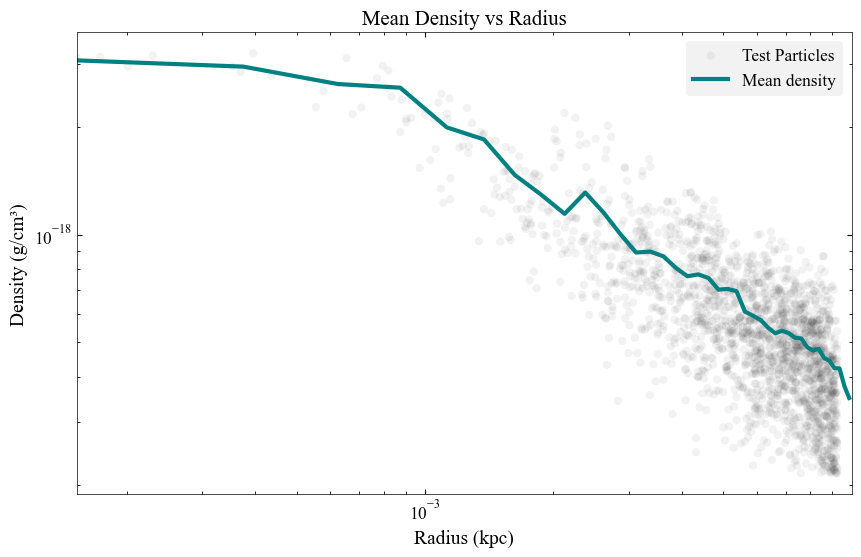

In [335]:
# find mean density in radius bins:
i = 0
n_bins = 40
Rmax = np.max(Rlist[0])
bin_edges = np.linspace(0, Rmax.value, n_bins + 1)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
dens = gh.densities(gh.convert_to_internal(hydrosim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), masses, h = gh.convert_to_internal(1*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None))
dens = gh.convert_to_physical(dens, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
# Assign each particle to a bin
bin_indices = np.digitize(Rlist[i].value, bin_edges)

# Calculate mean density in each bin
mean_dens_bins = []
for i in range(1, n_bins + 1):
    mask = bin_indices == i
    if np.sum(mask) > 0:
        mean_dens_bins.append(np.mean(dens[mask]).value)
    else:
        mean_dens_bins.append(np.nan)

mean_dens_bins = np.array(mean_dens_bins)

# Plot


plt.figure(figsize=(10, 6))
plt.scatter(Rlist[i], dens, alpha=0.05, label='Test Particles')
plt.plot(bin_centers, mean_dens_bins, lw=3, alpha=1, label='Mean density', c='teal')
plt.xlim(min(Rlist[i]).value,Rmax.to(u.kpc).value)
plt.xlabel('Radius (kpc)')
plt.ylabel('Density (g/cm³)')
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.title('Mean Density vs Radius')
plt.show()

In [336]:
np.linspace(0, len(ts)-1, 5, dtype='int')

array([  0, 199, 399, 599, 799])

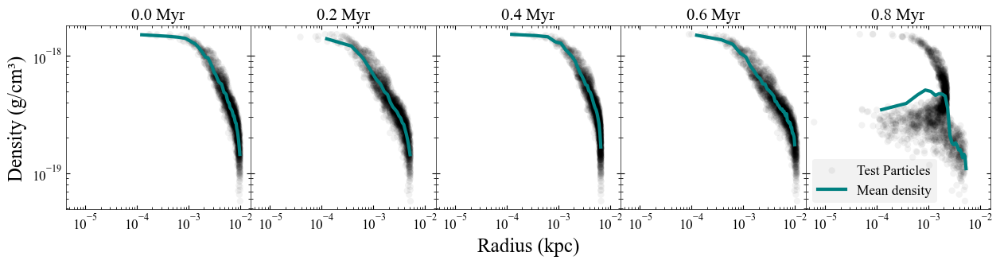

In [337]:
fig, ax = plt.subplots(1, 5, figsize=(15, 3), sharex=True, sharey=True, gridspec_kw={'wspace':0.0})
for i, ind in enumerate(np.linspace(0, len(ts)//2-1, 5, dtype='int')):
    dens = gh.densities(gh.convert_to_internal(sim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), masses, h = gh.convert_to_internal(2*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None))
    dens = gh.convert_to_physical(dens, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
    # Assign each particle to a bin
    bin_indices = np.digitize(Rlist[ind].value, bin_edges)
    # Calculate mean density in each bin
    mean_dens_bins = []
    for j in range(1, n_bins + 1):
        mask = bin_indices == j
        if np.sum(mask) > 0:
            mean_dens_bins.append(np.mean(dens[mask]).value)
        else:
            mean_dens_bins.append(np.nan)

    mean_dens_bins = np.array(mean_dens_bins)

    # Plot
    ax[i].scatter(Rlist[ind], dens, alpha=0.05, label='Test Particles')
    ax[i].plot(bin_centers, mean_dens_bins, lw=3, alpha=1, label='Mean density', c='teal')
    ax[i].set_title(f'{ts[ind]:.1f}')
    # plt.xlim(min(Rlist[i]).value,Rmax.to(u.kpc).value)
ax[2].set_xlabel('Radius (kpc)', fontsize=18)
ax[0].set_ylabel('Density (g/cm³)', fontsize=18)
ax[0].set_yscale('log')
ax[0].set_xscale('log')

plt.legend()
plt.show()

In [338]:
np.log10(Rmax.value)

np.float64(-2.0001879774083013)

In [357]:
n_bins = 40
Rmax = np.max(Rlist[0])
bin_edges = np.logspace(-5, 0, n_bins + 1)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

In [358]:
# fig, ax = plt.subplots(2, 5, figsize=(15,6.5), sharex=True, sharey=True, gridspec_kw={'wspace':0.0})
# for i, ind in enumerate(np.linspace(0, len(ts)//2 -1, 5, dtype='int')):
#     densGravity = gh.densities(gh.convert_to_internal(sim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), masses, h = gh.convert_to_internal(2*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None))
#     densGravity = gh.convert_to_physical(densGravity, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
#     # Assign each particle to a bin
#     bin_indices = np.digitize(Rlist[ind].value, bin_edges)
#     # Calculate mean density in each bin
#     mean_dens_bins = []
#     for j in range(1, n_bins + 1):
#         mask = bin_indices == j
#         if np.sum(mask) > 0:
#             mean_dens_bins.append(np.mean(densGravity[mask]).value)
#         else:
#             mean_dens_bins.append(np.nan)

#     mean_dens_bins = np.array(mean_dens_bins)

#     densHydro = gh.densities(gh.convert_to_internal(hydrosim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), masses, h = gh.convert_to_internal(2*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None))
#     densHydro = gh.convert_to_physical(densHydro, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
#     # Assign each particle to a bin
#     hydro_bin_indices = np.digitize(Rlisthydro[ind].value, bin_edges)
#     # Calculate mean density in each bin
#     mean_hydro_dens_bins = []
#     for j in range(1, n_bins + 1):
#         hydro_mask = hydro_bin_indices == j
#         if np.sum(mask) > 0:
#             mean_hydro_dens_bins.append(np.mean(densHydro[hydro_mask]).value)
#         else:
#             mean_hydro_dens_bins.append(np.nan)

#     mean_hydro_dens_bins = np.array(mean_hydro_dens_bins)


#     # Plot
#     ax[0, i].scatter(Rlist[ind], densGravity, alpha=0.05, label='Test Particles')
#     ax[0, i].plot(bin_centers, mean_dens_bins, lw=3, alpha=1, label='Mean density', c='teal')
#     ax[1, i].scatter(Rlisthydro[ind], densHydro, alpha=0.05, label='Test Particles')
#     ax[1, i].plot(bin_centers, mean_hydro_dens_bins, lw=3, alpha=1, label='Mean density', c='teal')
#     ax[0, i].set_title(f'{ts[ind]:.1f}')
#     # plt.xlim(min(Rlist[i]).value,Rmax.to(u.kpc).value)
# ax[1, 2].set_xlabel('Radius (kpc)', fontsize=18)
# ax[1, 0].set_ylabel('Density (g/cm³)', fontsize=18)
# ax[1, 0].set_yscale('log')
# ax[1, 0].set_xscale('log')
# # ax[0,0].set_ylim()
# plt.legend()
# plt.show()

In [359]:
# fig, ax = plt.subplots(2, 5, figsize=(15,6.5), sharex=True, sharey=True, gridspec_kw={'wspace':0.0})
# for i, ind in enumerate(np.linspace(0, len(ts)//2 -1, 5, dtype='int')):
#     densGravity = gh.densities(gh.convert_to_internal(sim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), masses, h = gh.convert_to_internal(2*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None))
#     densGravity = gh.convert_to_physical(densGravity, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
#     # Assign each particle to a bin
#     bin_indices = np.digitize(Rlist[ind].value, bin_edges)
#     # Calculate mean density in each bin
#     mean_dens_bins = []
#     for j in range(1, n_bins + 1):
#         mask = bin_indices == j
#         if np.sum(mask) > 0:
#             mean_dens_bins.append(np.mean(densGravity[mask]).value)
#         else:
#             mean_dens_bins.append(np.nan)

#     mean_dens_bins = np.array(mean_dens_bins)

#     densHydro = gh.densities(gh.convert_to_internal(hydrosim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), masses, h = gh.convert_to_internal(2*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None))
#     densHydro = gh.convert_to_physical(densHydro, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
#     # Assign each particle to a bin
#     hydro_bin_indices = np.digitize(Rlisthydro[ind].value, bin_edges)
#     # Calculate mean density in each bin
#     mean_hydro_dens_bins = []
#     for j in range(1, n_bins + 1):
#         hydro_mask = hydro_bin_indices == j
#         if np.sum(mask) > 0:
#             mean_hydro_dens_bins.append(np.mean(densHydro[hydro_mask]).value)
#         else:
#             mean_hydro_dens_bins.append(np.nan)

#     mean_hydro_dens_bins = np.array(mean_hydro_dens_bins)


#     # Plot
#     ax[0, i].scatter(Rlist[ind], densGravity, alpha=0.05, label='Test Particles')
#     ax[0, i].plot(bin_centers, mean_dens_bins, lw=3, alpha=1, label='Mean density', c='teal')
#     ax[1, i].scatter(Rlisthydro[ind], densHydro, alpha=0.05, label='Test Particles')
#     ax[1, i].plot(bin_centers, mean_hydro_dens_bins, lw=3, alpha=1, label='Mean density', c='teal')
#     ax[0, i].set_title(f'{ts[ind]:.1f}')
#     # plt.xlim(min(Rlist[i]).value,Rmax.to(u.kpc).value)
# ax[1, 2].set_xlabel('Radius (kpc)', fontsize=18)
# ax[1, 0].set_ylabel('Density (g/cm³)', fontsize=18)
# ax[1, 0].set_yscale('log')
# ax[1, 0].set_xscale('log')
# # ax[0,0].set_ylim()
# plt.legend()
# plt.show()

In [360]:
# get density in each bin by doing mass / volume:

In [361]:
masses_in_time = np.repeat(masses, len(ts)).reshape(-1, len(ts))

In [362]:
masses_in_time

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]], shape=(2000, 800))

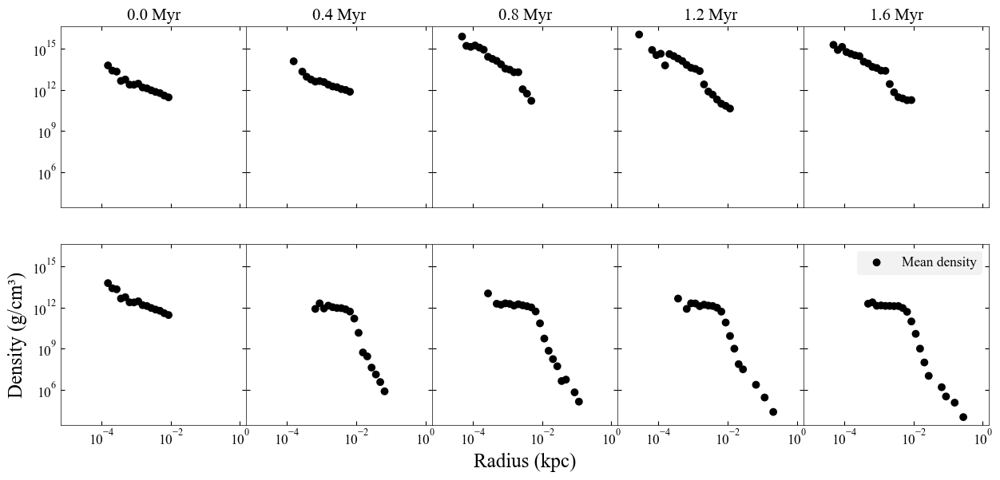

In [363]:
fig, ax = plt.subplots(2, 5, figsize=(15,6.5), sharex=True, sharey=True, gridspec_kw={'wspace':0.0})
for i, ind in enumerate(np.linspace(0, len(ts)//1 -1, 5, dtype='int')):
    #densGravity = gh.densities(gh.convert_to_internal(sim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), masses, h = gh.convert_to_internal(2*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None))
    #densGravity = gh.convert_to_physical(densGravity, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
    # Assign each particle to a bin
    bin_indices = np.digitize(Rlist[ind].value, bin_edges)
    
    # Calculate mean density in each bin
    mean_dens_bins = []
    for j in range(1, n_bins + 1):
        mask = bin_indices == j
        volume = 4 / 3 * np.pi * (bin_edges[j]**3 - bin_edges[j-1]**3)
        if np.sum(mask) > 0:
            mean_dens_bins.append((np.sum(masses_in_time[mask])/volume))
        else:
            mean_dens_bins.append(np.nan)

    mean_dens_bins = np.array(mean_dens_bins)

    #densHydro = gh.densities(gh.convert_to_internal(hydrosim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), masses, h = gh.convert_to_internal(2*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None))
    #densHydro = gh.convert_to_physical(densHydro, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
    # Assign each particle to a bin
    hydro_bin_indices = np.digitize(Rlisthydro[ind].value, bin_edges)
    # Calculate mean density in each bin
    mean_hydro_dens_bins = []
    for j in range(1, n_bins + 1):
        hydro_mask = hydro_bin_indices == j
        volume = 4 / 3 * np.pi * (bin_edges[j]**3 - bin_edges[j-1]**3)

        #print(np.sum(mask))
        #print(np.sum(masses_in_time[hydro_mask])/volume)
        if np.sum(hydro_mask) > 0:
            mean_hydro_dens_bins.append((np.sum(masses_in_time[hydro_mask])/volume))
        else:
            mean_hydro_dens_bins.append(0.0)
    #print(mean_hydro_dens_bins)
    mean_hydro_dens_bins = np.array(mean_hydro_dens_bins)


    # Plot
    #ax[0, i].scatter(Rlist[ind], densGravity, alpha=0.05, label='Test Particles')
    ax[0, i].scatter(bin_centers, mean_dens_bins, s=50, alpha=1, label='Mean density', c='k')
    #ax[1, i].scatter(Rlisthydro[ind], densHydro, alpha=0.05, label='Test Particles')
    ax[1, i].scatter(bin_centers, mean_hydro_dens_bins, s=50, alpha=1, label='Mean density', c='k')
    ax[0, i].set_title(f'{ts[ind]:.1f}')
    # plt.xlim(min(Rlist[i]).value,Rmax.to(u.kpc).value)
ax[1, 2].set_xlabel('Radius (kpc)', fontsize=18)
ax[1, 0].set_ylabel('Density (g/cm³)', fontsize=18)
ax[1, 0].set_yscale('log')
ax[1, 0].set_xscale('log')
# ax[0,0].set_ylim()
plt.legend()
plt.show()

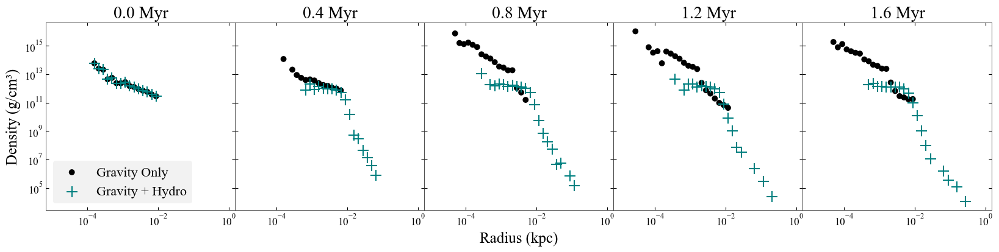

In [364]:
fig, ax = plt.subplots(1, 5, figsize=(20,4), sharex=True, sharey=True, gridspec_kw={'wspace':0.0})
for i, ind in enumerate(np.linspace(0, len(ts)//1 -1, 5, dtype='int')):
    #densGravity = gh.densities(gh.convert_to_internal(sim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), masses, h = gh.convert_to_internal(2*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None))
    #densGravity = gh.convert_to_physical(densGravity, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
    # Assign each particle to a bin
    bin_indices = np.digitize(Rlist[ind].value, bin_edges)
    
    # Calculate mean density in each bin
    mean_dens_bins = []
    for j in range(1, n_bins + 1):
        mask = bin_indices == j
        volume = 4 / 3 * np.pi * (bin_edges[j]**3 - bin_edges[j-1]**3)
        if np.sum(mask) > 0:
            mean_dens_bins.append((np.sum(masses_in_time[mask])/volume))
        else:
            mean_dens_bins.append(np.nan)

    mean_dens_bins = np.array(mean_dens_bins)

    #densHydro = gh.densities(gh.convert_to_internal(hydrosim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), masses, h = gh.convert_to_internal(2*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None))
    #densHydro = gh.convert_to_physical(densHydro, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
    # Assign each particle to a bin
    hydro_bin_indices = np.digitize(Rlisthydro[ind].value, bin_edges)
    # Calculate mean density in each bin
    mean_hydro_dens_bins = []
    for j in range(1, n_bins + 1):
        hydro_mask = hydro_bin_indices == j
        volume = 4 / 3 * np.pi * (bin_edges[j]**3 - bin_edges[j-1]**3)

        #print(np.sum(mask))
        #print(np.sum(masses_in_time[hydro_mask])/volume)
        if np.sum(hydro_mask) > 0:
            mean_hydro_dens_bins.append((np.sum(masses_in_time[hydro_mask])/volume))
        else:
            mean_hydro_dens_bins.append(0.0)
    #print(mean_hydro_dens_bins)
    mean_hydro_dens_bins = np.array(mean_hydro_dens_bins)


    # Plot
    #ax[0, i].scatter(Rlist[ind], densGravity, alpha=0.05, label='Test Particles')
    ax[i].scatter(bin_centers, mean_dens_bins, s=50, alpha=1, label='Gravity Only', c='k')
    #ax[1, i].scatter(Rlisthydro[ind], densHydro, alpha=0.05, label='Test Particles')
    ax[i].scatter(bin_centers, mean_hydro_dens_bins, s=150, alpha=1, label='Gravity + Hydro', c='teal', marker='+')
    ax[i].set_title(f'{ts[ind]:.1f}', fontsize=20)
    # plt.xlim(min(Rlist[i]).value,Rmax.to(u.kpc).value)
ax[2].set_xlabel('Radius (kpc)', fontsize=18)
ax[0].set_ylabel('Density (g/cm³)', fontsize=18)
ax[0].set_yscale('log')
ax[0].set_xscale('log')
# ax[0,0].set_ylim()
ax[0].legend(fontsize=16, loc='lower left', )
plt.show()

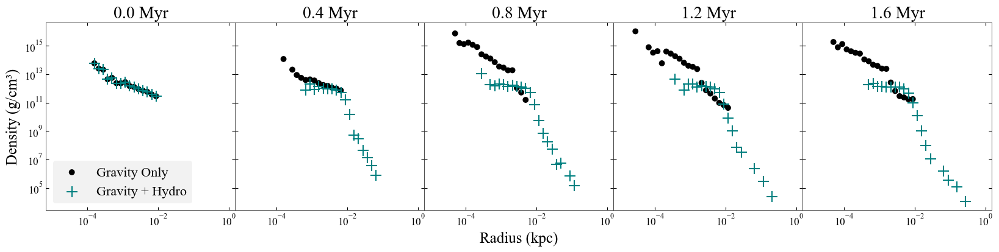

In [365]:
fig, ax = plt.subplots(1, 5, figsize=(20,4), sharex=True, sharey=True, gridspec_kw={'wspace':0.0})
for i, ind in enumerate(np.linspace(0, len(ts)//1 -1, 5, dtype='int')):
    #densGravity = gh.densities(gh.convert_to_internal(sim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), masses, h = gh.convert_to_internal(2*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None))
    #densGravity = gh.convert_to_physical(densGravity, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
    # Assign each particle to a bin
    bin_indices = np.digitize(Rlist[ind].value, bin_edges)
    
    # Calculate mean density in each bin
    mean_dens_bins = []
    for j in range(1, n_bins + 1):
        mask = bin_indices == j
        volume = 4 / 3 * np.pi * (bin_edges[j]**3 - bin_edges[j-1]**3)
        if np.sum(mask) > 0:
            mean_dens_bins.append((np.sum(masses_in_time[mask])/volume))
        else:
            mean_dens_bins.append(np.nan)

    mean_dens_bins = np.array(mean_dens_bins)

    #densHydro = gh.densities(gh.convert_to_internal(hydrosim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), masses, h = gh.convert_to_internal(2*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None))
    #densHydro = gh.convert_to_physical(densHydro, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
    # Assign each particle to a bin
    hydro_bin_indices = np.digitize(Rlisthydro[ind].value, bin_edges)
    # Calculate mean density in each bin
    mean_hydro_dens_bins = []
    for j in range(1, n_bins + 1):
        hydro_mask = hydro_bin_indices == j
        volume = 4 / 3 * np.pi * (bin_edges[j]**3 - bin_edges[j-1]**3)

        #print(np.sum(mask))
        #print(np.sum(masses_in_time[hydro_mask])/volume)
        if np.sum(hydro_mask) > 0:
            mean_hydro_dens_bins.append((np.sum(masses_in_time[hydro_mask])/volume))
        else:
            mean_hydro_dens_bins.append(0.0)
    #print(mean_hydro_dens_bins)
    mean_hydro_dens_bins = np.array(mean_hydro_dens_bins)


    # Plot
    #ax[0, i].scatter(Rlist[ind], densGravity, alpha=0.05, label='Test Particles')
    ax[i].scatter(bin_centers, mean_dens_bins, s=50, alpha=1, label='Gravity Only', c='k')
    #ax[1, i].scatter(Rlisthydro[ind], densHydro, alpha=0.05, label='Test Particles')
    ax[i].scatter(bin_centers, mean_hydro_dens_bins, s=150, alpha=1, label='Gravity + Hydro', c='teal', marker='+')
    ax[i].set_title(f'{ts[ind]:.1f}', fontsize=20)
    # plt.xlim(min(Rlist[i]).value,Rmax.to(u.kpc).value)
ax[2].set_xlabel('Radius (kpc)', fontsize=18)
ax[0].set_ylabel('Density (g/cm³)', fontsize=18)
ax[0].set_yscale('log')
ax[0].set_xscale('log')
# ax[0,0].set_ylim()
ax[0].legend(fontsize=16, loc='lower left', )
plt.savefig('')

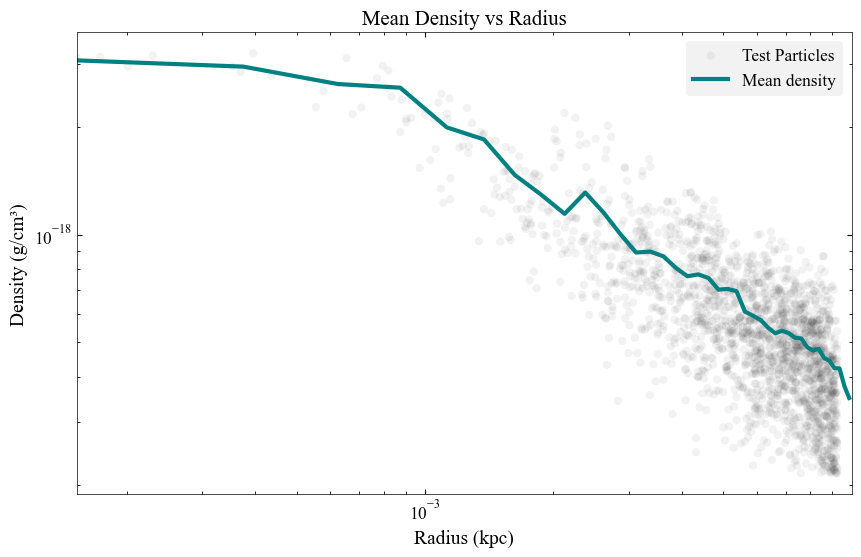

In [347]:
# find mean density in radius bins:
i = 0
n_bins = 40
Rmax = np.max(Rlist[0])
bin_edges = np.linspace(0, Rmax.value, n_bins + 1)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
dens = gh.densities(gh.convert_to_internal(sim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), masses, h = gh.convert_to_internal(1*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None))
dens = gh.convert_to_physical(dens, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
# Assign each particle to a bin
bin_indices = np.digitize(Rlist[i].value, bin_edges)

# Calculate mean density in each bin
mean_dens_bins = []
for i in range(1, n_bins + 1):
    mask = bin_indices == i
    if np.sum(mask) > 0:
        mean_dens_bins.append(np.mean(dens[mask]).value)
    else:
        mean_dens_bins.append(np.nan)

mean_dens_bins = np.array(mean_dens_bins)

# Plot


plt.figure(figsize=(10, 6))
plt.scatter(Rlist[i], dens, alpha=0.05, label='Test Particles')
plt.plot(bin_centers, mean_dens_bins, lw=3, alpha=1, label='Mean density', c='teal')
plt.xlim(min(Rlist[i]).value,Rmax.to(u.kpc).value)
plt.xlabel('Radius (kpc)')
plt.ylabel('Density (g/cm³)')
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.title('Mean Density vs Radius')
plt.show()

In [348]:
# max_dens = 0
# min_dens = 1
# for i in range(0, len(sim.positions)):
    
#     dens_i = gh.densities(
#             gh.convert_to_internal(sim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), 
#             masses, 
#             h=gh.convert_to_internal(1*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None)
#         )
#     if np.min(dens_i) < min_dens:
#         min_dens = np.min(dens_i)

#     if np.max(dens_i) > max_dens:
#         max_dens = np.max(dens_i)

In [349]:
min_dens = gh.convert_to_physical(np.min(all_dens), 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
max_dens = gh.convert_to_physical(np.max(all_dens), 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)

In [350]:
# min_dens, max_dens

In [351]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(10, 6))

def update(i):
    ax.clear()
    i = i * 5
    # Calculate density for this timestep
    dens_i = gh.densities(
        gh.convert_to_internal(sim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), 
        masses, 
        h=gh.convert_to_internal(1*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None)
    )
    dens_i = gh.convert_to_physical(dens_i, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
    
    # Calculate bins for this timestep
    Rmax_i = np.max(Rlist[0])
    Rmin_i  = min(Rlist[i])
    bin_edges_i = np.linspace(Rmin_i.value, Rmax_i.value, n_bins + 1)
    bin_centers_i = (bin_edges_i[:-1] + bin_edges_i[1:]) / 2
    bin_indices_i = np.digitize(Rlist[i].value, bin_edges_i)
    
    # print(Rmin_i, bin_edges_i[0])
    
    # Calculate mean density in each bin
    mean_dens_bins_i = []
    for j in range(1, n_bins + 1):
        mask = bin_indices_i == j
        if np.sum(mask) > 0:
            #print(np.mean(dens_i[mask]).value)
            mean_dens_bins_i.append(np.mean(dens_i[mask]).value)
        else:
            mean_dens_bins_i.append(np.nan)
    mean_dens_bins_i = np.array(mean_dens_bins_i)
    
    # Plot
    ax.scatter(Rlist[i], dens_i, alpha=0.05, label='Test Particles')
    ax.plot(bin_centers_i, mean_dens_bins_i, lw=3, alpha=1, label='Mean density', c='teal')
    ax.set_xlabel('Radius (kpc)')
    ax.set_ylabel('Density (g/cm³)')
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend()
    ax.set_ylim(min_dens.value, max_dens.value)
    ax.set_xlim(np.min(Rlist).value, Rmax_i.value)
    ax.set_title(f'Mean Density vs Radius - Timestep {i}/{len(sim.positions)-1}')
    
anim = FuncAnimation(fig, update, frames=len(sim.positions)//5, interval=100, repeat=True)
plt.close()
HTML(anim.to_jshtml())

/var/folders/s1/bxkg8f1501g2q16qjhch2_qw0000gn/T/ipykernel_9394/3414746556.py:45: UserWarning:

Attempt to set non-positive ylim on a log-scaled axis will be ignored.



In [ ]:
np.log10(Rmax.value)

np.float64(-2.000268305293249)

In [ ]:
Rmax.to(u.pc)

<Quantity 9.99382395 pc>

In [113]:
import plotly.graph_objects as go

# Calculate global min/max for axis limits
all_dens = []
all_Rs = []
plot_every = 5
for i_ in range(len(sim.positions)//plot_every):
    i = i_ * plot_every
    dens_i = gh.densities(
        gh.convert_to_internal(sim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), 
        masses, 
        h=gh.convert_to_internal(1*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None)
    )
    dens_i = gh.convert_to_physical(dens_i, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
    all_dens.append(dens_i.value)
    all_Rs.append(Rs[i].value)

# Get global limits
r_min, r_max = np.min(all_Rs)*0.001, np.max(all_Rs)
dens_min, dens_max = np.min(all_dens), np.max(all_dens)

# Prepare frames
frames = []
for i in range(len(sim.positions)):
    dens_i = gh.densities(
        gh.convert_to_internal(sim.positions[i], unitLength=1*u.pc, unitMass=None, unitTime=None), 
        masses, 
        h=gh.convert_to_internal(1*u.pc, unitLength=1*u.pc, unitMass=None, unitTime=None)
    )
    dens_i = gh.convert_to_physical(dens_i, 'mass density', True, unitLength=1*u.pc, unitMass=None, unitTime=None)
    
    Rmax_i = np.max(Rs[i])
    bin_edges_i = np.linspace(0, Rmax_i.value, n_bins + 1)
    bin_centers_i = (bin_edges_i[:-1] + bin_edges_i[1:]) / 2
    bin_indices_i = np.digitize(Rs[i].value, bin_edges_i)
    
    mean_dens_bins_i = []
    for j in range(1, n_bins + 1):
        mask = bin_indices_i == j
        if np.sum(mask) > 0:
            mean_dens_bins_i.append(np.mean(dens_i[mask]).value)
        else:
            mean_dens_bins_i.append(np.nan)
    mean_dens_bins_i = np.array(mean_dens_bins_i)
    
    frames.append(go.Frame(
        data=[
            go.Scatter(x=Rs[i].value, y=dens_i.value, mode='markers', 
                      marker=dict(size=3, opacity=0.05), name='Test Particles'),
            go.Scatter(x=bin_centers_i, y=mean_dens_bins_i, mode='lines', 
                      line=dict(width=3, color='teal'), name='Mean density')
        ],
        name=str(i)
    ))

# Create initial plot
fig = go.Figure(
    data=frames[0].data,
    frames=frames
)

# Add slider and play button with fixed axis ranges
fig.update_layout(
    title='Mean Density vs Radius - Time Evolution',
    xaxis=dict(title='Radius (pc)', type='log', range=[np.log10(r_min), np.log10(r_max)]),
    yaxis=dict(title='Density (g/cm³)', type='log', range=[np.log10(dens_min), np.log10(dens_max)]),
    updatemenus=[{
        'type': 'buttons',
        'showactive': False,
        'buttons': [
            {'label': 'Play', 'method': 'animate', 'args': [None, {'frame': {'duration': 100, 'redraw': True}}]},
            {'label': 'Pause', 'method': 'animate', 'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate'}]}
        ]
    }],
    sliders=[{
        'steps': [{'args': [[f.name], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate'}],
                  'label': f'i={f.name}', 'method': 'animate'} for f in frames],
        'active': 0,
        'yanchor': 'top',
        'xanchor': 'left'
    }]
)

fig.show()

ValueError: 
    Invalid value of type 'numpy.float64' received for the 'x' property of scatter
        Received value: np.float64(9.3944955814835)

    The 'x' property is an array that may be specified as a tuple,
    list, numpy array, or pandas Series

# Isothermal Collapse

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import astropy.units as u

## Particles initialized with density ~ 1/r

Use inverse transform sampling.

Probability of find a particle in an infinitesimal volume element $dV = 4 \pi r^2 dr$ is $P(r) dV$.

$ r = R_{\text{max}} \sqrt{U}$, where $U$ are uniformly distributed random numbers.




In [ ]:
n_pts = int(1e4)
U = np.random.uniform(0, 1, n_pts)

Rmax = (5e16 * u.cm).to(u.pc) # units pc
Rs = Rmax * np.sqrt(U)
phis = 2 * np.pi * np.random.uniform(0, 1, n_pts)
thetas = np.arccos(2 * np.random.rand(n_pts) - 1)

xs = Rs * np.sin(thetas) * np.cos(phis)
ys = Rs * np.sin(thetas) * np.sin(phis)
zs = Rs * np.cos(thetas)

In [ ]:
pos = np.array([xs, ys, zs]).T * u.pc

In [ ]:
import plotly.graph_objects as go

# fig = go.Figure(data=[go.Scatter3d(
#     x=xs.value,
#     y=ys.value,
#     z=zs.value,
#     mode='markers',
#     marker=dict(
#         size=2,
#         color=Rs.value,
#         colorscale='Viridis',
#         showscale=True,
#         colorbar=dict(title='R (pc)')
#     )
# )])

# fig.update_layout(
#     title='3D Distribution of Particles',
#     scene=dict(
#         xaxis_title='x (pc)',
#         yaxis_title='y (pc)',
#         zaxis_title='z (pc)'
#     ),
#     width=800,
#     height=800
# )

# fig.show()

In [ ]:
rho0 = 3.82e-18 *u.g * u.cm**3
cs = 1.66e4 * u.cm / u.s

In [ ]:
from scipy.spatial import KDTree

# Build KDTree for efficient nearest neighbor search
tree = KDTree(pos.value)

# Query for the 2 nearest neighbors (includes the particle itself)
# k=2 because the closest neighbor is the particle itself
distances, indices = tree.query(pos.value, k=2)

# The second column contains distances to the nearest neighbor (excluding itself)
nearest_neighbor_distances = distances[:, 1] * u.pc

# Calculate average nearest neighbor distance
avg_nearest_neighbor_distance = np.mean(nearest_neighbor_distances)

print(f"Average nearest neighbor distance: {avg_nearest_neighbor_distance:.4f}")


Average nearest neighbor distance: 0.0007 pc


In [ ]:
# Confirm that denities follow 1/r power law.
cloud_mass = 1 * u.Msun
cloud_volume = (4/3) * np.pi * Rmax**3
particle_mass = cloud_mass / n_pts
masses = np.ones(n_pts) * particle_mass

from gravhydro import densities, convert_to_internal, convert_to_physical
h = 2 * avg_nearest_neighbor_distance
dens = densities(convert_to_internal(pos), convert_to_internal(masses), convert_to_internal(h))
dens = convert_to_physical(dens, 'mass density', True)

TypeError: convert_to_internal() missing 3 required positional arguments: 'unitLength', 'unitTime', and 'unitMass'

In [ ]:
# find mean density in radius bins:

n_bins = 40
bin_edges = np.linspace(0, Rmax.value, n_bins + 1)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Assign each particle to a bin
bin_indices = np.digitize(Rs.value, bin_edges)

# Calculate mean density in each bin
mean_dens_bins = []
for i in range(1, n_bins + 1):
    mask = bin_indices == i
    if np.sum(mask) > 0:
        mean_dens_bins.append(np.mean(dens[mask]).value)
    else:
        mean_dens_bins.append(np.nan)

mean_dens_bins = np.array(mean_dens_bins)

# Plot


plt.figure(figsize=(10, 6))
plt.scatter(Rs, dens, alpha=0.05, label='Test Particles')
plt.plot(bin_centers, mean_dens_bins, lw=3, alpha=1, label='Mean density', c='teal')
plt.xlabel('Radius (pc)')
plt.ylabel('Density (g/cm³)')
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.title('Mean Density vs Radius')
plt.show()

IndexError: boolean index did not match indexed array along axis 0; size of axis is 1000 but size of corresponding boolean axis is 10000

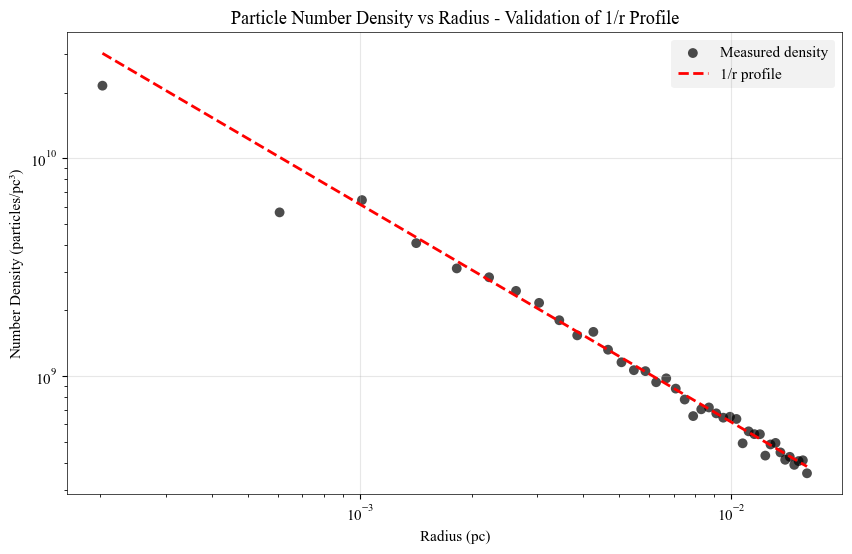

In [ ]:
# Validate 1/r density profile by counting particles in radial bins
n_bins = 40
bin_edges = np.linspace(0, Rmax.value, n_bins + 1)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
bin_widths = bin_edges[1:] - bin_edges[:-1]

# Count particles in each bin
counts, _ = np.histogram(Rs.value, bins=bin_edges)

# Calculate shell volumes
shell_volumes = (4/3) * np.pi * (bin_edges[1:]**3 - bin_edges[:-1]**3)

# Number density (particles per unit volume)
number_density = counts / shell_volumes

# Plot
plt.figure(figsize=(10, 6))
plt.scatter(bin_centers, number_density, s=50, alpha=0.7, label='Measured density')
plt.plot(bin_centers, 1/bin_centers * np.median(number_density * bin_centers), 
         'r--', linewidth=2, label='1/r profile')
plt.xlabel('Radius (pc)')
plt.ylabel('Number Density (particles/pc³)')
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.title('Particle Number Density vs Radius - Validation of 1/r Profile')
plt.grid(True, alpha=0.3)
plt.show()


## Add solid body rotation

In [ ]:
omega = 7.2e-13 * u.rad / u.s